In [18]:
from datetime import datetime

import cv2
from matplotlib import pyplot as plt
import time
import json
import numpy as np
import pandas as pd
from keras.models import load_model
import pickle

%matplotlib inline

# Analyse Dataset
### General indicators

In [2]:
TRAIN_PATH = "data_v2/meta/train.json"
TEST_PATH = "data_v2/meta/test.json"

In [3]:
test_json = json.load(open(TEST_PATH))
train_json = json.load(open(TRAIN_PATH))

In [6]:
print("------------- Info Train Set -------------")
for key, value in train_json.items():
    print("Number of images for {} : {}".format(key, len(value)))
    
print("------------- Info Test Set -------------")
for key, value in test_json.items():
    print("Number of images for {} : {}".format(key, len(value)))

------------- Info Train Set -------------
Number of images for female : 2665
Number of images for male : 692
------------- Info Test Set -------------
Number of images for female : 370
Number of images for male : 97


### Conclusion
We have an unbalanced dataset, but the training and the test have the same classes proportions

# Data Display

We will show randomly some images from the train and the test to know what we are dealing with.

We also use a front face detector and a profile face detector, to find out if it works correctly by displaying the result of the box on the image. These detecters come from cv2 library.

Furthermore we use a gender classifier offer by cv2 library. We display the male in blue, female in green, and we display the box in red when the classifier is not confident.

In [4]:
DIR_IMG = "/Users/lolo/Développement/Python/Fashwell/data_v2/img/"

In [5]:
def preprocess_input(x):
    x = x.astype('float32')
    x = x / 255.0
    return x

def convertToRGB(img): 
    return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

In [6]:
class FaceRecognition():
    def __init__(self, face_detector, profile_face_detector, gender_classifier):
        self.face_detector = face_detector
        self.profile_face_detector = profile_face_detector
        self.gender_classifier = gender_classifier
        self.gender_target_size = gender_classifier.input_shape[1:3]
    
    def get_faces_coordinates_from_img(self, rgb_img):
        gray_img = cv2.cvtColor(rgb_img, cv2.COLOR_RGB2GRAY)
        faces = self.face_detector.detectMultiScale(gray_img, scaleFactor=1.2, minNeighbors=5)
        profile_faces = self.profile_face_detector.detectMultiScale(gray_img, scaleFactor=1.2, minNeighbors=5)
        faces_coordinates = np.concatenate([np.array(faces).reshape(-1, 4).astype(int), np.array(profile_faces).reshape(-1, 4).astype(int)])
        return faces_coordinates
    
    def add_border_on_itenfied_faces(self, img, identified_faces, genders):
        threshold = 0.85
        for i, (x, y, w, h) in enumerate(identified_faces):
            if genders[i][0] > threshold:
                cv2.rectangle(img, (int(x - 0.2 * w), int(y - 0.2 * h)), (int(x + 1.2 * w), int(y + 1.2 * h)), (0, 255, 0), 10)
            elif genders[i][0] < 1 - threshold:
                cv2.rectangle(img, (int(x - 0.2 * w), int(y - 0.2 * h)), (int(x + 1.2 * w), int(y + 1.2 * h)), (0, 0, 255), 10)
            else:
                cv2.rectangle(img, (int(x - 0.2 * w), int(y - 0.2 * h)), (int(x + 1.2 * w), int(y + 1.2 * h)), (255, 0, 0), 10)

        return img
    
    def get_faces(self, rgb_img, coordinates, output_size):
        faces = np.zeros((len(coordinates), output_size, output_size, 3))
        
        for i, (x, y, w, h) in enumerate(coordinates):
            rgb_face = rgb_img[max(0, y - int(0.5 * h)) : min(y + int(1.5 * h), rgb_img.shape[0]), max(0, x - int(0.5 * w)) : min(x + int(1.5 * w), rgb_img.shape[1]),:]

            rgb_face = cv2.resize(rgb_face, (self.gender_target_size))
            rgb_face = preprocess_input(rgb_face)
            rgb_face = np.expand_dims(rgb_face, 0)
            faces[i] = rgb_face
        
        return faces
        
    def get_gender_from_faces(self, faces):
        # 0 : female, 1: male
        results = self.gender_classifier.predict(faces)
        return results

In [11]:
# params
img_per_row = 9
img_per_col = 9
img_size = 256

# method
def display_random_images(class_name, dataset_json, detect_face=False):
    
    if detect_face:
        profileface = cv2.CascadeClassifier('models/face_classification/haarcascade_profileface.xml')
        face = cv2.CascadeClassifier('models/face_classification/haarcascade_frontalface_alt.xml')
        gender_classifier = load_model("models/face_classification/simple_CNN.81-0.96.hdf5", compile=False)
        fr = FaceRecognition(face, profileface, gender_classifier)

    np.random.seed(42)
    img_grid = np.zeros((img_size * img_per_row, img_size * img_per_col, 3))
    idx_img = np.random.choice(len(dataset_json[class_name]), img_per_row * img_per_col, replace=False)
    
    for i, img_name in enumerate(np.array(dataset_json[class_name])[idx_img]):
        img_path = DIR_IMG + img_name
        img = cv2.imread(img_path)
        img = convertToRGB(img)
        
        if detect_face:
            faces_coordinates = fr.get_faces_coordinates_from_img(img)
            faces = fr.get_faces(img, faces_coordinates, 48)
            if len(faces > 0):
                genders = fr.get_gender_from_faces(faces)
                fr.add_border_on_itenfied_faces(img, faces_coordinates, genders)
        
        img = cv2.resize(img, (img_size, img_size))
        img = preprocess_input(img)
        row_number = int(i / img_per_col)
        column_number = i % img_per_col
        img_grid[row_number * img_size : (row_number + 1) * img_size,
                 column_number * img_size : (column_number + 1) * img_size, :] = img[:, :, :]

    plt.figure(figsize=(15, 15))
    plt.title("Class : {}".format(class_name))
    plt.axis('off')
    plt.imshow(img_grid)
    plt.show()

TRAIN SET


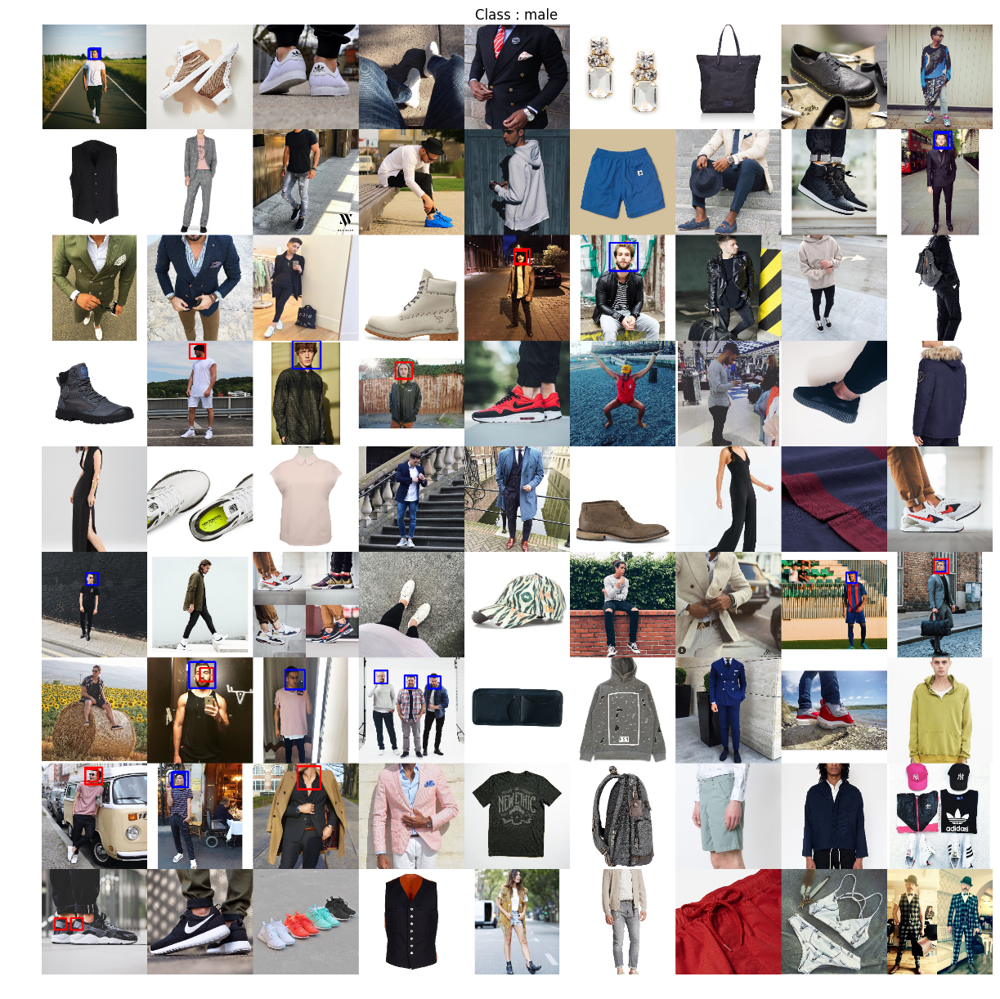

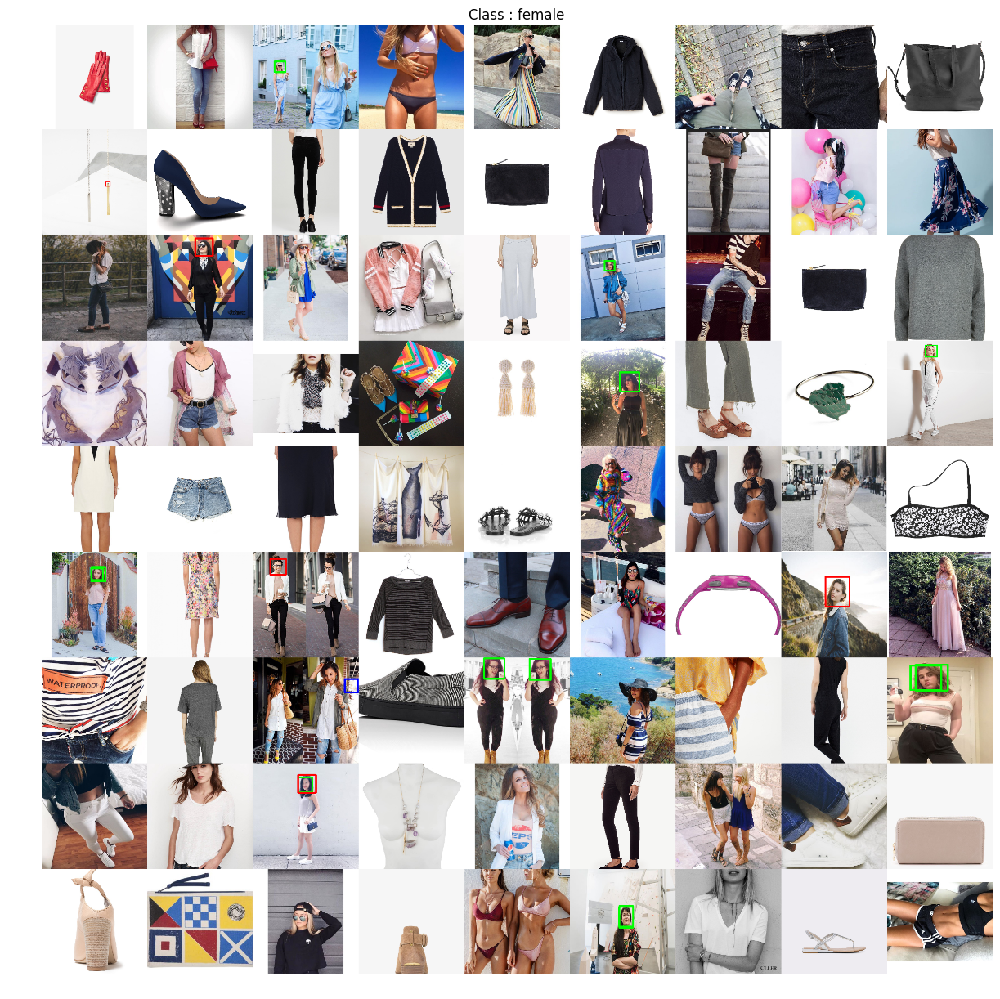

In [12]:
print("TRAIN SET")
display_random_images("male", train_json, True)
display_random_images("female", train_json, True)

TEST SET


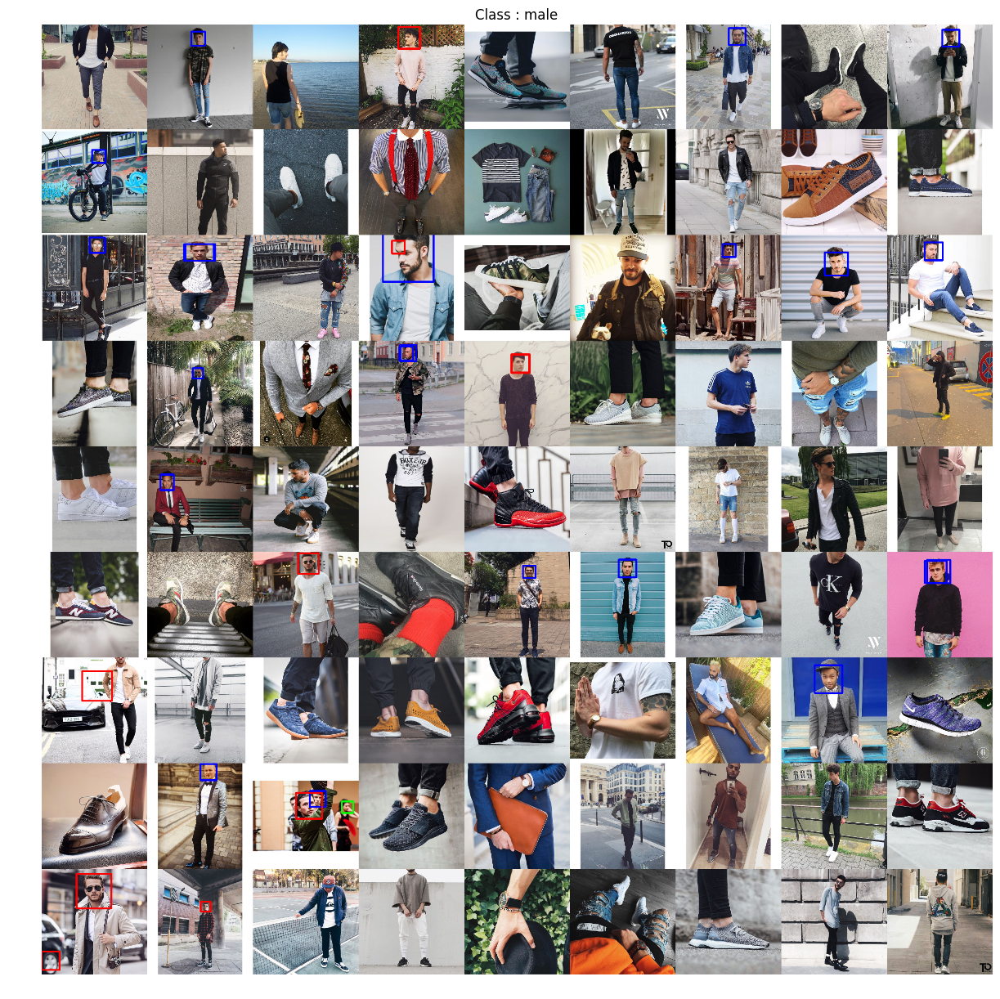

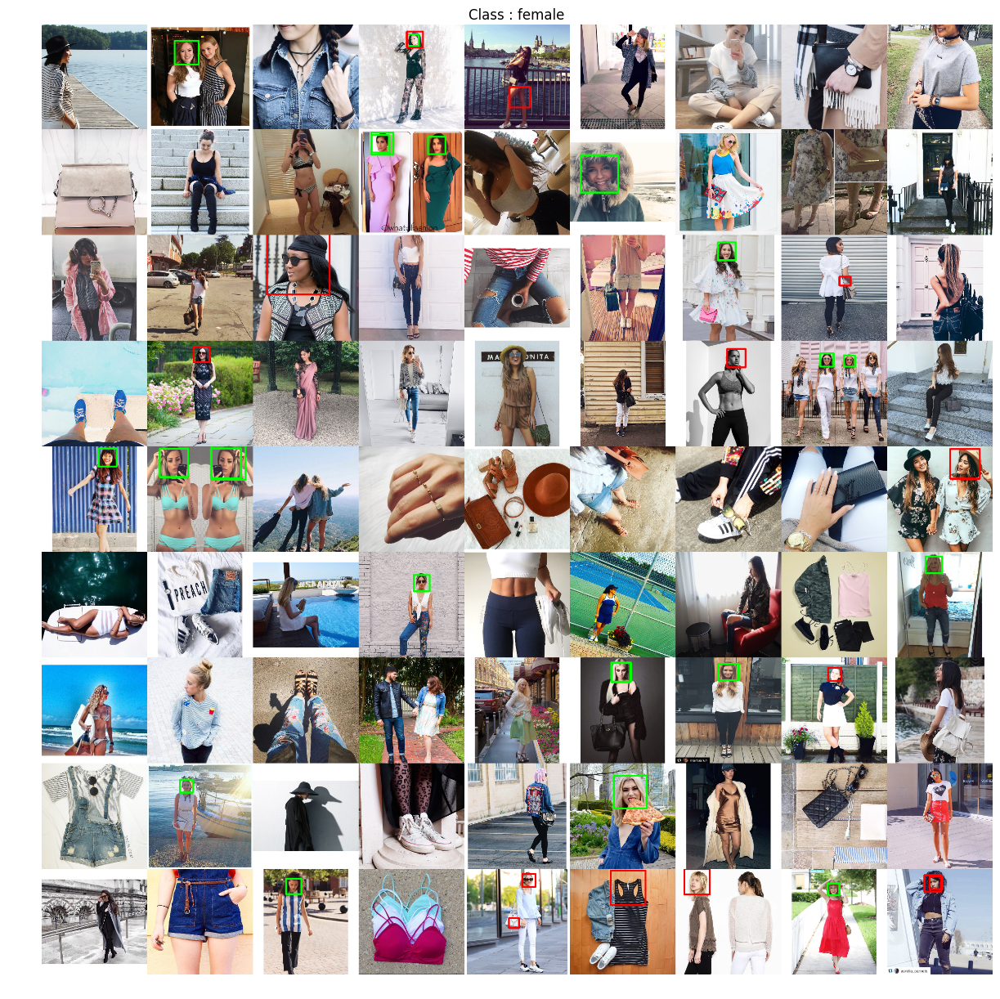

In [13]:
print("TEST SET")
display_random_images("male", test_json, True)
display_random_images("female", test_json, True)

### Conclusion
We have different kind of images : people on white background, people in the street, clothes, shooes, jewelry...

The detection of faces seems to work quite well, event if it does not detects all the faces.

# Performance measure
We want to measure the performances of the model that classify a face into male or female.

We will test different values for the treshold used to know if the classifier is confident enough to classify the face.


### Init dataframe which will contain all results

In [15]:
# We load all images from the test into a dataframe
df_result_test = pd.DataFrame(test_json["female"] + test_json["male"], columns=["img_name"])
df_result_test["female"] = df_result_test.apply(axis=1, func=lambda x: 1 if x["img_name"].startswith("female") else 0)
df_result_test["male"] = df_result_test.apply(axis=1, func=lambda x: 1 if x["img_name"].startswith("male") else 0)
df_result_test["come_from"] = "test"

In [16]:
# We load all images from the train into another dataframe
df_result_train = pd.DataFrame(train_json["female"] + train_json["male"], columns=["img_name"])
df_result_train["female"] = df_result_train.apply(axis=1, func=lambda x: 1 if x["img_name"].startswith("female") else 0)
df_result_train["male"] = df_result_train.apply(axis=1, func=lambda x: 1 if x["img_name"].startswith("male") else 0)
df_result_train["come_from"] = "train"

In [17]:
# We concat these two dataframes into a single one
df_result = pd.concat([df_result_test, df_result_train]).reset_index(drop=True)
df_result["y_true"] = 0
df_result.loc[df_result["male"] ==1, ["y_true"]] = 1
df_result.head()

,img_name,female,male,come_from,y_true
0,female/A-lAXnFZ_gY.jpg,1,0,test,0
1,female/A-lDrEHv_7c.jpg,1,0,test,0
2,female/A-lDrM7vsJ4.jpg,1,0,test,0
3,female/A-lEDmCMY_k.jpg,1,0,test,0
4,female/A-lGiLTxuiU.jpg,1,0,test,0


### Computation of the results of the model for different thresholds

In [330]:
def compute_gender_label(img_name, threshold):
    prediction = -1
    img_path = DIR_IMG + str(img_name)
    img = cv2.imread(img_path)
    img = convertToRGB(img)
    
    faces_coordinates = fr.get_faces_coordinates_from_img(img)
    faces = fr.get_faces(img, faces_coordinates, 48)
    
    if len(faces > 0):
        genders = fr.get_gender_from_faces(faces)
        idx_max = np.unravel_index(genders.argmax(), genders.shape)
        if genders[idx_max] > threshold:
            prediction = idx_max[1]

    return prediction

In [332]:
for i in range(55, 96, 5):
    threshold = i/100.
    print("Beginning of computing results for threshold {} at {}".format(threshold, str(datetime.now())))
    df_result[str(threshold)] = df_result.apply(axis=1, func= lambda x: compute_gender_label(x["img_name"], threshold))

Beginning of computing results for threshold 0.55 at 2017-11-24 00:00:06.951249
Beginning of computing results for threshold 0.6 at 2017-11-24 00:27:19.827127
Beginning of computing results for threshold 0.65 at 2017-11-24 00:54:28.622759
Beginning of computing results for threshold 0.7 at 2017-11-24 01:21:34.595978
Beginning of computing results for threshold 0.75 at 2017-11-24 01:48:37.252403
Beginning of computing results for threshold 0.8 at 2017-11-24 02:15:38.060497
Beginning of computing results for threshold 0.85 at 2017-11-24 02:42:31.671425
Beginning of computing results for threshold 0.9 at 2017-11-24 03:09:29.821811
Beginning of computing results for threshold 0.95 at 2017-11-24 03:36:26.004868


In [ ]:
df_result.to_csv("result_identification_gender.csv")

### Compute f1 score

In [450]:
from sklearn.metrics import precision_recall_fscore_support

In [465]:
def compute_f1score(df):
    list_f1_score = []
    for i in range(55, 96, 5):
        img_classified = df[df[str(i/100.)] != -1]
        nb_img_classified = len(img_classified)
        result = precision_recall_fscore_support(img_classified["y_true"], img_classified[str(i/100.)])

        list_nb_img.append(nb_img_classified)
        list_f1_score.append(np.mean(result[2]))

        print("Treshold : {}".format(str(i/100.)))
        print("Number of images that are clssified : {}".format(nb_img_classified))
        print("F1 score : {:.0%}".format(np.mean(result[2])))
        print("**************************")
        
    return list_f1_score

In [466]:
f1_scores = compute_f1score(df_result)

Treshold : 0.55
Number of images that are clssified : 855
F1 score : 77%
**************************
Treshold : 0.6
Number of images that are clssified : 828
F1 score : 79%
**************************
Treshold : 0.65
Number of images that are clssified : 793
F1 score : 81%
**************************
Treshold : 0.7
Number of images that are clssified : 763
F1 score : 83%
**************************
Treshold : 0.75
Number of images that are clssified : 726
F1 score : 84%
**************************
Treshold : 0.8
Number of images that are clssified : 680
F1 score : 86%
**************************
Treshold : 0.85
Number of images that are clssified : 618
F1 score : 88%
**************************
Treshold : 0.9
Number of images that are clssified : 533
F1 score : 89%
**************************
Treshold : 0.95
Number of images that are clssified : 375
F1 score : 91%
**************************


# Detect noise in train

We can see that there is noise in the train : pictures of women are in the male folder, and pictures of men are in the female folder.

We can use the face detector, and the gender classifier to detect this images that are misclassified.

We will set a high threshold, to show only pictures that the classifier is sure to be right and that are not belonging to their right folder.

### For male

In [396]:
def compute_and_show_misclassified_labels(label, threshold, dataset):
    sure_results_in_train = df_result[(df_result[threshold] != -1) & ( df_result["come_from"] == dataset)]
    ko_result_male = sure_results_in_train.loc[(df_result[threshold] != df_result["y_true"])
                                               & (df_result[label] == 1),
                                               ["img_name"]]
    
    print("Number of misclassified pictures for male : {}".format(len(ko_result_male)))
    
    for img_name in ko_result_male.values.ravel():
        print(img_name)
        img = convertToRGB(cv2.imread(DIR_IMG + img_name))
        plt.figure(figsize=(2, 2))
        plt.imshow(img)
        plt.axis('off')
        plt.show()
    
    return ko_result_male.values.ravel()

Number of misclassified pictures for male : 17
male/A-lEKpPNtR4.jpg


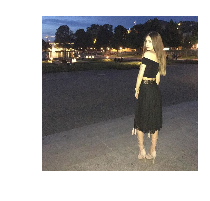

male/A-n351FRRzA.jpg


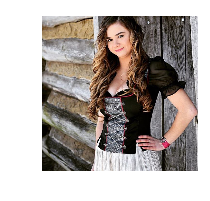

male/A-niS0q3YAU.jpg


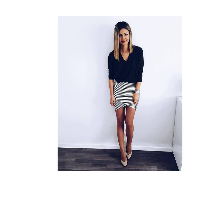

male/A-pZrY0iWN0.jpg


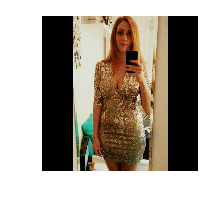

male/A-pdEfnQtOM.jpg


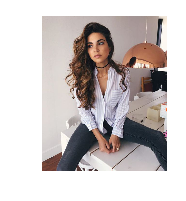

male/A-plvGzhyvs.jpg


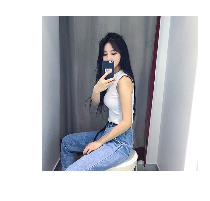

male/Ae32IjJe1vo.jpg


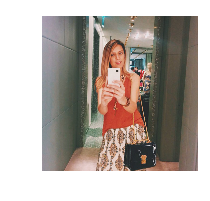

male/Ae3Rp5dNs_k.jpg


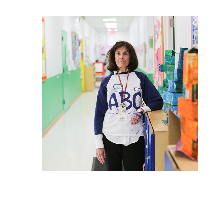

male/BB40MG1fZQg.jpg


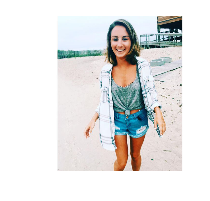

male/BB7dreZhNRU.jpg


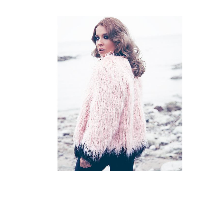

male/BD_AHzwmdq0.jpg


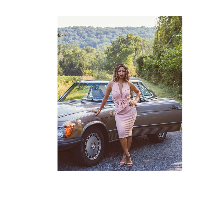

male/BEBPR0TntVE.jpg


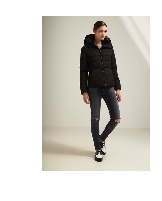

male/BEpA6PPeEgQ.jpg


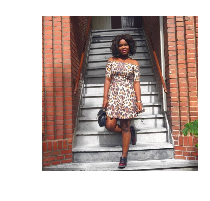

male/BEr8mnZ0qjk.jpg


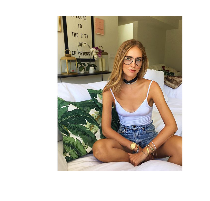

male/BEsBPBfsOsA.jpg


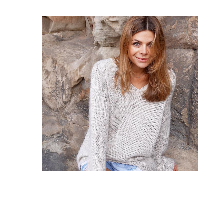

male/rIbHiInexl1F5Kcw.jpg


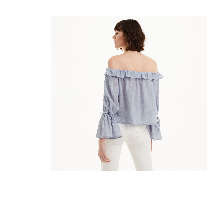

male/tQOCZeJ89-cyjIH_.jpg


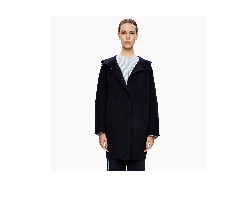

In [397]:
misclassified_male = compute_and_show_misclassified_labels("male", "0.85", "train")

## For female

Number of misclassified pictures for male : 21
female/2ZJqPKaNyPvl_u56.jpg


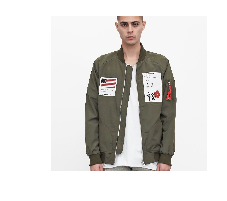

female/A-mY0qDwZis.jpg


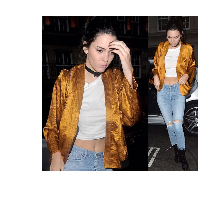

female/A-nmwfbmhsk.jpg


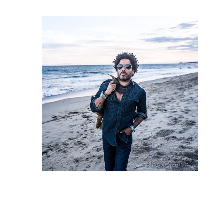

female/A-odmTvo4NY.jpg


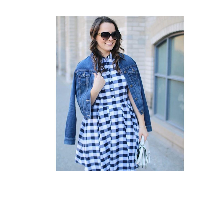

female/A-p0d6eBj0M.jpg


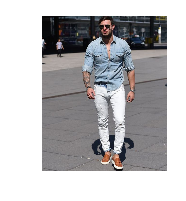

female/A-p1JPttDqA.jpg


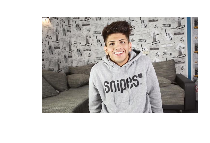

female/A-pKR6YfwPc.jpg


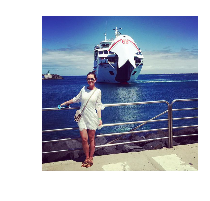

female/AdF2mijxKxw.jpg


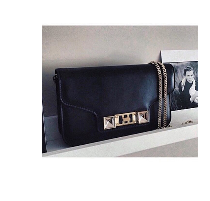

female/Ae4GTjH2Tjg.jpg


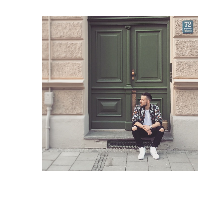

female/BB5ENbZr87Q.jpg


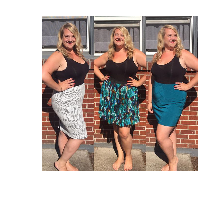

female/BB5o1FdAdRk.jpg


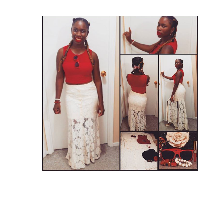

female/BB9EOwpXUOk.jpg


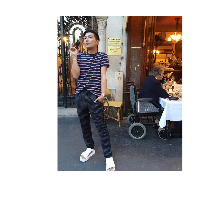

female/BD-29w2tDMg.jpg


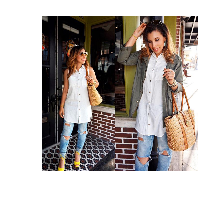

female/BD_9s1nCYrU.jpg


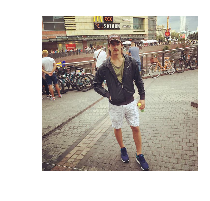

female/BEpn0qrz1w4.jpg


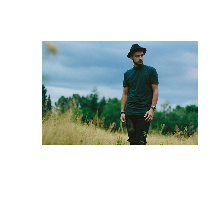

female/BEq3_FQpo70.jpg


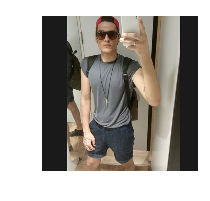

female/GsfMfr9IoMnfoenZ.jpg


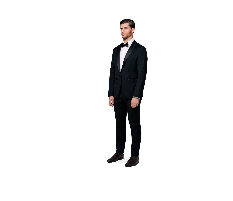

female/HB5vuJ131XnpSKoj.jpg


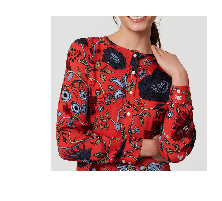

female/LOg18EgOPsnQB8Yr.jpg


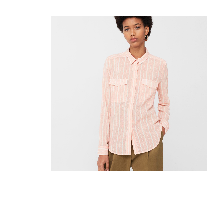

female/ZmoW63VloUeEks2B.jpg


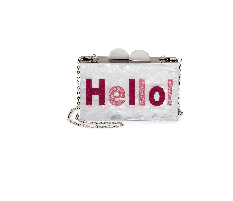

female/i1z7-YEa1MEjz4-X.jpg


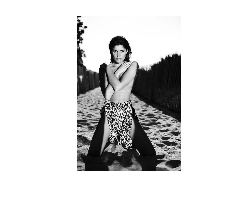

In [398]:
misclassified_female = compute_and_show_misclassified_labels("female", "0.9", "train")

In [399]:
real_misclassified_female = ["female/2ZJqPKaNyPvl_u56.jpg", "female/A-nmwfbmhsk.jpg", "female/A-p0d6eBj0M.jpg", "female/A-p1JPttDqA.jpg", "female/Ae4GTjH2Tjg.jpg", "female/BB9EOwpXUOk.jpg", "female/BD_9s1nCYrU.jpg", "female/BEpn0qrz1w4.jpg", "female/BEq3_FQpo70.jpg", "female/GsfMfr9IoMnfoenZ.jpg"]

In [414]:
misclassified_data = {
    "male": list(misclassified_male),
    "female": real_misclassified_female
}

with open('misclassified_data.pkl', 'wb') as handle:
    pickle.dump(misclassified_data, handle, protocol=pickle.HIGHEST_PROTOCOL)

# Compute new performances whithout noise

Now that we have detected the noise, we can correct it (change the ground truth label of these misclassified pictures), and compute again the f1 score

In [434]:
df_result_no_noise = df_result.copy()

In [443]:
df_result_no_noise["female"] = df_result_no_noise.apply(axis=1, 
                                                        func=lambda x:
                                                        1 if (x["img_name"].startswith("female"))
                                                        & (x["img_name"] not in real_misclassified_female)
                                                        else 0)

df_result_no_noise["male"] = df_result_no_noise.apply(axis=1, func=lambda x: 
                                                        1 if (x["img_name"].startswith("male"))
                                                        & (x["img_name"] not in misclassified_male)
                                                        else 0)
df_result_no_noise["y_true"] = 0
df_result_no_noise.loc[df_result_no_noise["male"] == 1, ["y_true"]] = 1

In [467]:
f1_scores_no_noise = compute_f1score(df_result_no_noise)

Treshold : 0.55
Number of images that are clssified : 855
F1 score : 79%
**************************
Treshold : 0.6
Number of images that are clssified : 828
F1 score : 81%
**************************
Treshold : 0.65
Number of images that are clssified : 793
F1 score : 84%
**************************
Treshold : 0.7
Number of images that are clssified : 763
F1 score : 85%
**************************
Treshold : 0.75
Number of images that are clssified : 726
F1 score : 87%
**************************
Treshold : 0.8
Number of images that are clssified : 680
F1 score : 89%
**************************
Treshold : 0.85
Number of images that are clssified : 618
F1 score : 92%
**************************
Treshold : 0.9
Number of images that are clssified : 533
F1 score : 93%
**************************
Treshold : 0.95
Number of images that are clssified : 375
F1 score : 95%
**************************


### Comparaison of f1 score with and without noise

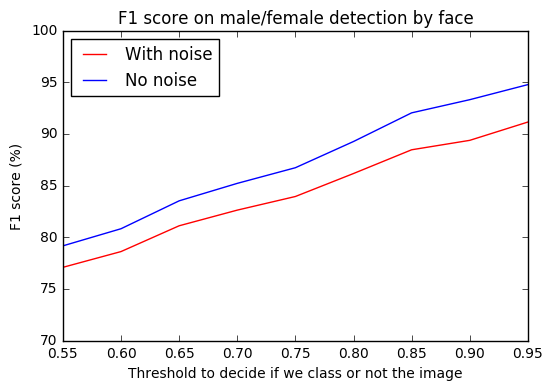

In [480]:
plt.plot(np.arange(55, 96, 5)/100, np.array(f1_scores) * 100, 'r', label='With noise')
plt.plot(np.arange(55, 96, 5)/100, np.array(f1_scores_no_noise) * 100, 'b', label='No noise')
plt.ylim(70, 100)
plt.legend(loc="upper left")
plt.title("F1 score on male/female detection by face")
plt.xlabel('Threshold to decide if we class or not the image')
plt.ylabel('F1 score (%)')
plt.show()

### Conclusion
Now whe have the real f1 score without the noise, also we can choose wisely the best threshold for the gender classifier, which is a compromise between the score and the number of images that are classified.